<a href="https://colab.research.google.com/github/Jasarin-V/CorrGAN/blob/master/CorrGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from google.colab import drive

import pandas as pd
import seaborn as sns
import scipy.cluster.hierarchy as spc

from scipy.spatial.distance import squareform, pdist

!pip install fastcluster
import fastcluster

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
cd 'drive/My Drive/Colab Notebooks'

/content/drive/My Drive/Colab Notebooks


In [0]:
# wrsd = pd.read_csv('wrsd.csv')
# wrsd['ADJ'] = wrsd['PRC']/wrsd['CFACPR']
# wrsd = wrsd.pivot_table(values = 'ADJ', index = 'date', columns = 'PERMNO')
# wrsd = wrsd.loc[:,~((wrsd.isnull()).sum(axis = 0) > 0)]
# wrsd = wrsd.abs().dropna()
# wrsd.to_csv('wrds_cleaned.csv')
# del wrsd

In [0]:
wrds = pd.read_csv('wrds_cleaned.csv', index_col = 0)
wrds = np.log(wrds).diff().iloc[1:,:].dropna(axis = 1)
wrds_1 = wrds.iloc[:(len(wrds) // 2)]
wrds_2 = wrds.iloc[(len(wrds) // 2):]

del wrds
del wrds_2

In [0]:
# full_corr = wrds_1.corr()
# full_corr = full_corr.dropna(how = 'all').dropna(0, how = 'all')
# del wrds_1
# del wrds_2

In [0]:
def sample_cluster(n, N):
  '''
  Randomly sample n x n sub-matrix fromfull_corr with replacement
  Use hierarhcical clustering to cluster similar tickers together

  int n: dimension of correlation matrix
  int N: number of training samples to draw

  return (N, n, n) ndarray of clustered sub-matrix
  '''
  sampled = np.zeros((N, n, n))
  indices = np.arange(full_corr.shape[0])
  a, b = np.triu_indices(n, k=1)

  for i in range(N):
    idx = np.random.choice(indices, size = n, replace = False)
    raw_corr = full_corr.iloc[idx, idx].values
    dist = 1 - raw_corr

    Z = fastcluster.linkage(dist[a, b], method='ward')
    p_idx = spc.leaves_list(spc.optimal_leaf_ordering(Z, dist[a, b]))
    sampled[i] = raw_corr[p_idx, :][:, p_idx]
  return sampled

In [0]:
def sample_time(n, N):
  T = len(wrds_1)
  sampled = np.zeros((N, n, n))
  indices = np.arange(wrds_1.shape[1])
  a, b = np.triu_indices(n, k = 1)

  for i in range(N):
    t = np.random.randint(T-250)
    idx = np.random.choice(indices, size = n, replace = False)
    raw_corr = wrds_1.iloc[t:(t+250), idx].corr().values
    dist = squareform(pdist(np.sqrt(0.5 * (1 - raw_corr))))
    # dist = 1 - raw_corr
    Z = fastcluster.linkage(dist[a, b], method='ward')
    p_idx = spc.leaves_list(spc.optimal_leaf_ordering(Z, dist[a, b]))
    sampled[i] = raw_corr[p_idx, :][:, p_idx]
  return sampled

In [0]:
def sample_time2(n, N):
  T = len(wrds_2)
  sampled = np.zeros((N, n, n))
  indices = np.arange(wrds_2.shape[1])
  a, b = np.triu_indices(n, k = 1)

  for i in range(N):
    t = np.random.randint(T-250)
    idx = np.random.choice(indices, size = n, replace = False)
    raw_corr = wrds_2.iloc[t:(t+250), idx].corr().values
    dist = squareform(pdist(np.sqrt(0.5 * (1 - raw_corr))))
    # dist = 1 - raw_corr
    Z = fastcluster.linkage(dist[a, b], method='ward')
    p_idx = spc.leaves_list(spc.optimal_leaf_ordering(Z, dist[a, b]))
    sampled[i] = raw_corr[p_idx, :][:, p_idx]
  return sampled

In [0]:
# n = full_corr.shape[0]
# x, y = np.triu_indices(n, k=1)
# dist = squareform(pdist(np.sqrt(0.5 * (1 - full_corr))))
# Z = fastcluster.linkage(dist[x, y], method='ward')
# p_idx = spc.leaves_list(spc.optimal_leaf_ordering(Z, dist[x, y]))
# corr_ord = full_corr.values[p_idx, :][:, p_idx]
# sns.heatmap(full_corr, cmap="Spectral", xticklabels=False, yticklabels=False)
# sns.heatmap(corr_ord, cmap="Spectral", xticklabels=False, yticklabels=False)

In [0]:


# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 256

# # Spatial size of training images. All images will be resized to this
# #   size using a transformer.
image_size = 64
# image_size = 3

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100
# nz = 5

# Size of feature maps in generator
# ngf = 64
ngf = image_size

# Size of feature maps in discriminator
# ndf = 64
ndf = image_size

# Number of training epochs
num_epochs = 20

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
    
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
# print(netG)

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
# print(netD)

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0



Random Seed:  999


In [0]:
from time import time

sz = 25600
st = time()

# X = sample_cluster(image_size, sz).reshape((sz,1,image_size,image_size))
X = sample_time(image_size, sz).reshape((sz,1,image_size,image_size))
print(time() - st)
tnx = torch.from_numpy(X).float()
dataset = torch.utils.data.TensorDataset(tnx)

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

143.94002890586853


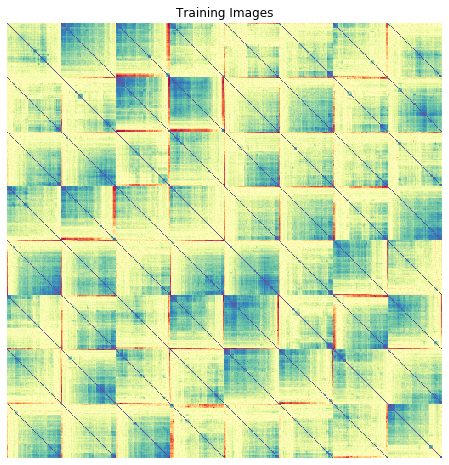

In [0]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
img_to_plot = np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=0).cpu(),(1,2,0))
plt.imshow(img_to_plot[:,:,0], cmap="Spectral")

In [0]:
print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Only Update When  D
        if epoch % 3 == 0:
          optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # # Check how the generator is doing by saving G's output on fixed_noise
        # if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
        #     with torch.no_grad():
        #         fake = netG(fixed_noise).detach().cpu()
        #     img_list.append(vutils.make_grid(fake, padding=0, normalize=True))

        iters += 1

    ####################################### 
    #Make Sure to empty cache every epoch #
    #         And Save MODELS!!!!!!!      #
    #######################################
    torch.cuda.empty_cache() 
    
    # drive.mount('/content/drive')
    torch.save(netG.state_dict(), 'netG1{:d}'.format(epoch))
    torch.save(netD.state_dict(), 'netD1{:d}'.format(epoch))  
    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
    img_list.append(vutils.make_grid(fake, padding=0))


Starting Training Loop...
[0/20][0/391]	Loss_D: 1.9999	Loss_G: 4.5682	D(x): 0.6106	D(G(z)): 0.7005 / 0.0188
[0/20][50/391]	Loss_D: 0.3669	Loss_G: 22.7307	D(x): 0.8458	D(G(z)): 0.0000 / 0.0000
[0/20][100/391]	Loss_D: 0.8005	Loss_G: 7.2332	D(x): 0.9983	D(G(z)): 0.4652 / 0.0116
[0/20][150/391]	Loss_D: 0.3387	Loss_G: 4.1715	D(x): 0.8944	D(G(z)): 0.1686 / 0.0342
[0/20][200/391]	Loss_D: 0.4571	Loss_G: 2.9242	D(x): 0.8400	D(G(z)): 0.1989 / 0.0979
[0/20][250/391]	Loss_D: 0.5585	Loss_G: 2.6543	D(x): 0.7958	D(G(z)): 0.2352 / 0.1123
[0/20][300/391]	Loss_D: 0.5123	Loss_G: 2.2742	D(x): 0.8027	D(G(z)): 0.2226 / 0.1511
[0/20][350/391]	Loss_D: 1.2372	Loss_G: 3.8947	D(x): 0.8994	D(G(z)): 0.6069 / 0.0300
[1/20][0/391]	Loss_D: 0.6358	Loss_G: 1.2047	D(x): 0.8464	D(G(z)): 0.3433 / 0.3433
[1/20][50/391]	Loss_D: 3.7163	Loss_G: 0.0407	D(x): 0.8486	D(G(z)): 0.9612 / 0.9612
[1/20][100/391]	Loss_D: 4.6161	Loss_G: 0.0147	D(x): 0.8663	D(G(z)): 0.9856 / 0.9856
[1/20][150/391]	Loss_D: 4.9944	Loss_G: 0.0097	D(x): 0.8

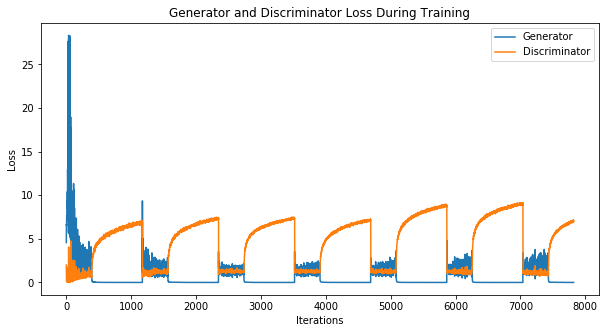

In [0]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="Generator")
plt.plot(D_losses,label="Discriminator")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [0]:
# %%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0))[:,:, 0], cmap="Spectral", animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

%matplotlib inline
HTML(ani.to_jshtml())


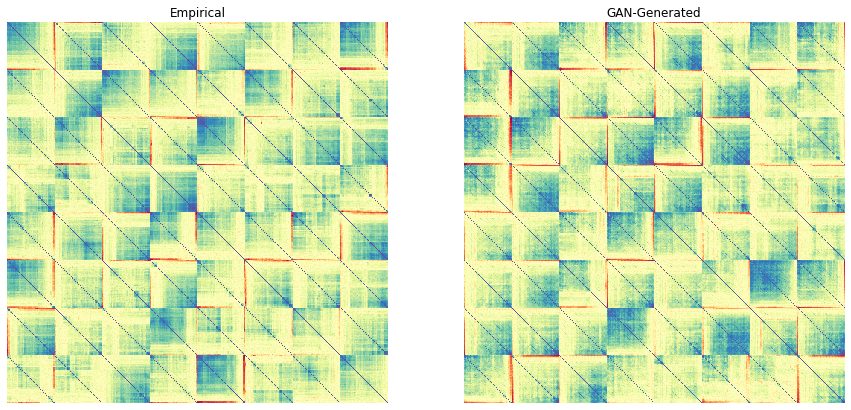

In [0]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Empirical")
to_plot_real = np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=0).cpu(),(1,2,0))
plt.imshow(to_plot_real[:, :, 0], cmap="Spectral")

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("GAN-Generated")
to_plot_fake = np.transpose(img_list[-2],(1,2,0))
plt.imshow(to_plot_fake[:,:,0], cmap="Spectral")
plt.show()

In [0]:
netG = Generator(ngpu).to(device)
netG.load_state_dict(torch.load('netG118'))
gen_imgs = []

for i in range(100):
  with torch.no_grad():
          noise = torch.randn(batch_size, nz, 1, 1, device=device)
          fake = netG(noise).detach().cpu()
          gen_imgs.extend(fake)

# New Section

In [0]:
from mpl_toolkits.mplot3d import Axes3D
from itertools import permutations

def sample_3(corrs):
  sampled = np.zeros((corrs.shape[0], 3, 3))
  indices = np.arange(corrs.shape[1])

  for i in range(len(corrs)):
    idx = np.random.choice(indices, size = 3, replace = False)
    sampled[i] = corrs[i][idx][:, idx]
  return sampled

def pull_3_coords(corrs):
  res = np.zeros((len(corrs)*6, 3))
  for i in range(len(corrs)):
    j = i*6
    res[j:(j+6), :] = np.array(list(permutations(corrs[i][np.triu_indices(3, k =1)])))
  return res

In [0]:
def nearPSD(A,epsilon=0):
   n = A.shape[0]
   eigval, eigvec = np.linalg.eig(A)
   val = np.matrix(np.maximum(eigval,epsilon))
   vec = np.matrix(eigvec)
   T = 1/(np.multiply(vec,vec) * val.T)
   T = np.matrix(np.sqrt(np.diag(np.array(T).reshape((n)) )))
   B = T * vec * np.diag(np.array(np.sqrt(val)).reshape((n)))
   out = B*B.T
   return(out)

def proj_nearest(corrs):
  res = np.zeros(corrs.shape)
  for i in range(len(res)):
    corr = corrs[i]
    res[i] = nearPSD((corr + corr.T)/2.0)
  return res

In [0]:
real_sc = pull_3_coords(sample_3(X.squeeze()[:]))

In [0]:
# fake_np = np.array([gen_imgs[i].numpy()[0] for i in range(len(gen_imgs))])
# del gen_imgs

# proj_fake = proj_nearest(fake_np)
fake_sc = pull_3_coords(sample_3(proj_fake))

In [0]:
st = time()
rnd_onion = [sample_unif_correlmat(3) for i in range(20000)]
sc_onion = pull_3_coords(rnd_onion)
print(time() - st)

5.595439910888672


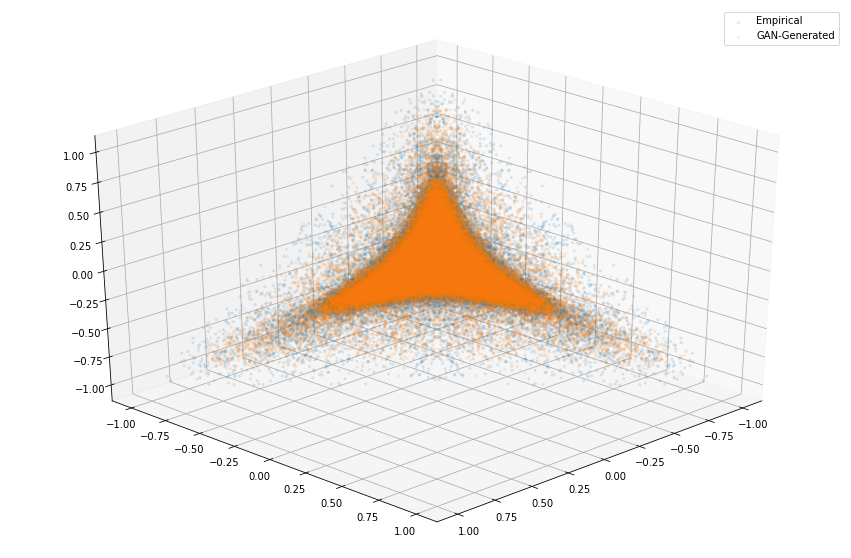

In [0]:
fig = plt.figure(figsize = (15,10))
ax = fig.add_subplot(111, projection='3d')


# ax.scatter(sc_onion[:,0],sc_onion[:,1],sc_onion[:,2], s = 5, alpha = 0.01, label = 'Full Space')
# ax.scatter(real_sc[:20000,0],real_sc[:20000,1],real_sc[:20000,2], s = 5, alpha = 0.1, label = 'Empirical')
ax.scatter(real_sc[:,0],real_sc[:,1],real_sc[:,2], s = 5, alpha = 0.1, label = 'Empirical')
# ax.scatter(sc_psd[:,0],sc_psd[:,1],sc_psd[:,2], s = 5, alpha = 0.6, label = 'Wilshart')
ax.scatter(fake_sc[:,0], fake_sc[:,1],fake_sc[:,2], s = 5, alpha = 0.1, label = 'GAN-Generated')
# ax.scatter(fake_sc[:,0], fake_sc[:,1],fake_sc[:,2], s = 5, alpha = 0.4, label = 'GAN-Generated', c='orange')
ax.view_init(azim=45)
plt.legend()
plt.show()

In [0]:
st = time()
rnd_psd = random_psd(64, 250, 25600)
# sc_psd = pull_3_coords(rnd_psd)
print(time() - st)

19.953721523284912


In [0]:
def cov_to_corr(cov):
	d = np.sqrt(np.diag(cov)).reshape(-1,1)
	return cov / np.dot(d, d.T)
 
def random_psd(m, n, N):
  # A = np.random.uniform(-1, 1, size = (N, m, n))
  A = np.random.randn(N, m, n)
  res = np.zeros((N, m, m))
  for i in range(N):
    res[i] = cov_to_corr(np.matmul(A[i], A[i].T))
  # return res / n
  return res

def lmbda_bounds(m, n):
  Q = n/m
  lmbda_p = (1 + 1/np.sqrt(Q))**2
  lmbda_m = (1 - 1/np.sqrt(Q))**2
  return Q, lmbda_p, lmbda_m

def MP_pdf(lmbda, m, n):
  Q, lmbda_p, lmbda_m = lmbda_bounds(m, n)
  return Q/2/np.pi * np.sqrt((lmbda_p - lmbda)*(-lmbda_m + lmbda))/lmbda

def eigs(corrs, proj = False):
  return np.linalg.eigvals(corrs)

In [0]:
fake_eig = eigs(proj_fake)

In [0]:
fake_eig_np = eigs(fake_np)

In [0]:
real_eig = eigs(X.squeeze())

In [0]:
np.save('fake_eig', fake_eig)
np.save('real_eig', real_eig)

In [0]:
fake_eig = np.load('fake_eig.npy')
real_eig = np.load('real_eig.npy')

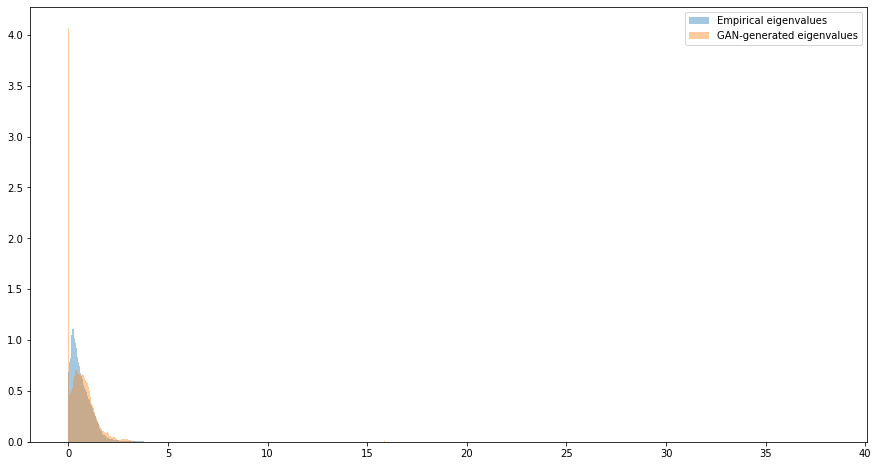

In [0]:
plt.figure(figsize=(15,8))
sns.distplot(real_eig, bins = 1000, label = 'Empirical eigenvalues', kde=False, norm_hist=True)
sns.distplot(fake_eig, bins = 1000, label = 'GAN-generated eigenvalues', kde=False, norm_hist=True)
plt.legend()
plt.show()

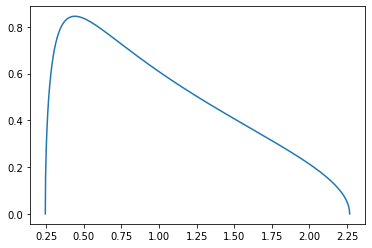

In [0]:
T = 250
N = 64

Q, lmbda_p, lmbda_m = lmbda_bounds(N, T)

x_space = np.linspace(lmbda_m, lmbda_p, 1000)
plt.plot(x_space, MP_pdf(x_space, N, T))

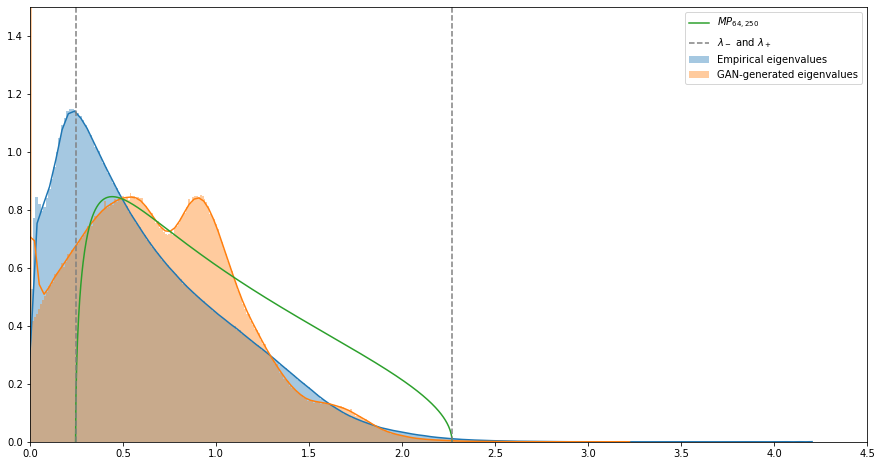

In [0]:
plt.figure(figsize=(15,8))
sns.distplot(real_eig[:,2:], bins = 300, label = 'Empirical eigenvalues', kde=True, norm_hist=True)
sns.distplot(fake_eig[:,2:-7], bins = 300, label = 'GAN-generated eigenvalues', kde=True, norm_hist=True)
plt.ylim(0, 1.5)
plt.xlim(0,4.5)
plt.plot(x_space, MP_pdf(x_space, N, T), label = r'$MP_{64, 250}$')

plt.axvline(lmbda_p, linestyle='dashed', color='gray', label = r'$\lambda_-$ and $\lambda_+$')
plt.legend()
plt.axvline(lmbda_m, linestyle='dashed', color='gray')
plt.show()

In [0]:
plt.figure(figsize=(15,8))
sns.distplot(real_eig[:,2:], bins = 300, label = 'Empirical eigenvalues', kde=True, norm_hist=True)
sns.distplot(fake_eig[:,2:-7], bins = 300, label = 'GAN-generated eigenvalues', kde=True, norm_hist=True)
plt.ylim(0, 1.5)
plt.xlim(0,4.5)
plt.plot(x_space, MP_pdf(x_space, N, T), label = r'$MP_{64, 250}$')

plt.axvline(lmbda_p, linestyle='dashed', color='gray', label = r'$\lambda_-$ and $\lambda_+$')
plt.legend()
plt.axvline(lmbda_m, linestyle='dashed', color='gray')
plt.show()

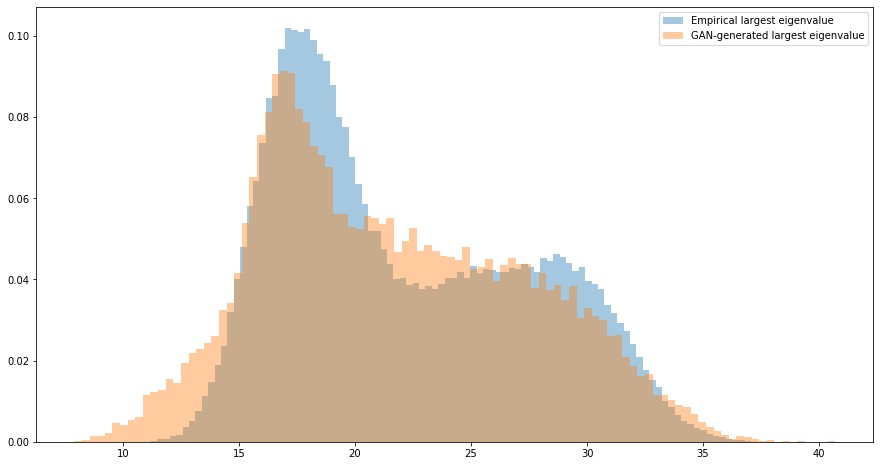

In [0]:
plt.figure(figsize=(15,8))
sns.distplot(real_eig[:,0], bins = 100, label = 'Empirical largest eigenvalue', kde=False, norm_hist=True)
sns.distplot(fake_eig[:,0], bins = 100, label = 'GAN-generated largest eigenvalue', kde=False, norm_hist=True)
plt.legend()
# plt.ylim(0, 2.5)
plt.show()

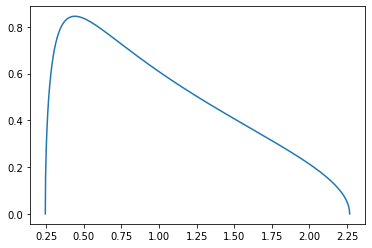

In [0]:
plt.figure(figsize=(15,8))
sns.distplot(X.squeeze()[:25600], bins = 1000, label = 'Empirical largest eigenvalue')
sns.distplot(proj_fake, bins = 1000, label = 'GAN-generated largest eigenvalue')
# sns.distplot(fake_np, bins = 1000, label = 'GAN-generated largest eigenvalue', kde=False, norm_hist=True)
plt.ylim(0,3)
plt.xlim(-0.99, 0.99)
plt.legend()
plt.show()


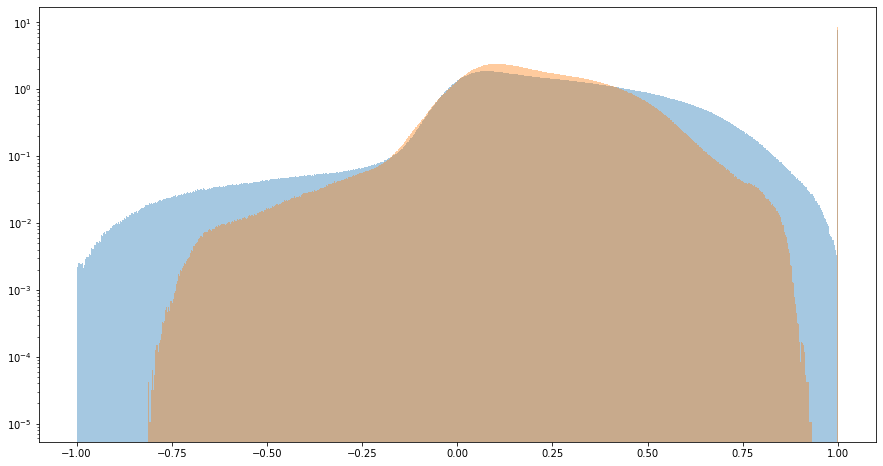

In [0]:
plt.figure(figsize=(15,8))
ax = sns.distplot(X.squeeze()[:25600], bins = 1000, label = 'Empirical largest eigenvalue', kde=False, norm_hist=True)
sns.distplot(proj_fake, bins = 1000, label = 'GAN-generated largest eigenvalue', kde=False, norm_hist=True)
ax.set_yscale('log')


In [0]:

def calculate_fid(act1, act2):
	# calculate mean and covariance statistics
	mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
	mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
	# calculate sum squared difference between means
	ssdiff = numpy.sum((mu1 - mu2)**2.0)
	# calculate sqrt of product between cov
	covmean = sqrtm(sigma1.dot(sigma2))
	# check and correct imaginary numbers from sqrt
	if iscomplexobj(covmean):
		covmean = covmean.real
	# calculate score
	fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
	return fid

In [0]:
import scipy
def sample_unif_correlmat(dimension):
    d = dimension + 1

    prev_corr = np.matrix(np.ones(1))
    for k in range(2, d):
        # sample y = r^2 from a beta distribution with alpha_1 = (k-1)/2 and alpha_2 = (d-k)/2
        y = np.random.beta((k - 1) / 2, (d - k) / 2)
        r = np.sqrt(y)

        # sample a unit vector theta uniformly from the unit ball surface B^(k-1)
        v = np.random.randn(k-1)
        theta = v / np.linalg.norm(v)

        # set w = r theta
        w = np.dot(r, theta)

        # set q = prev_corr**(1/2) w
        q = np.dot(scipy.linalg.sqrtm(prev_corr), w)

        next_corr = np.zeros((k, k))
        next_corr[:(k-1), :(k-1)] = prev_corr
        next_corr[k-1, k-1] = 1
        next_corr[k-1, :(k-1)] = q
        next_corr[:(k-1), k-1] = q

        prev_corr = next_corr
        
    return next_corr

In [0]:
rnd_onion = [sample_unif_correlmat(3) for i in range(20000)]
sc_onion = pull_3_coords(rnd_onion)

NameError: ignored

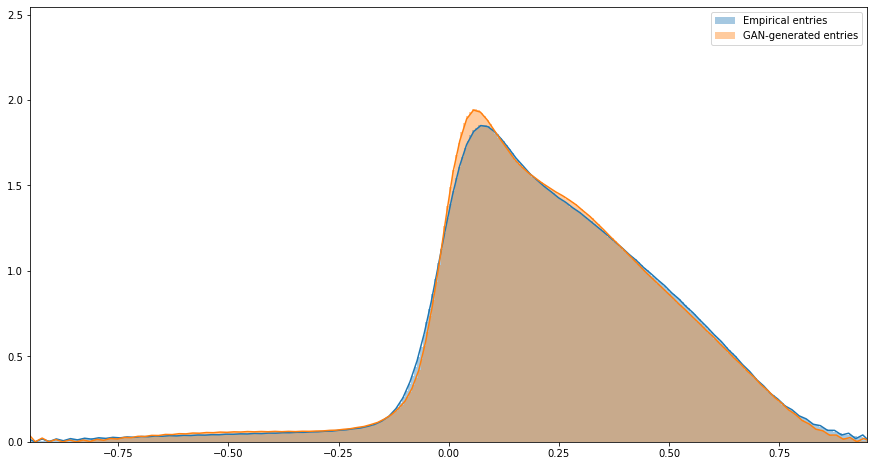

In [0]:
plt.figure(figsize=(15,8))
sns.distplot(X.flatten(), bins = 300, label = 'Empirical entries', kde=True, norm_hist=True)
sns.distplot(proj_fake.flatten(), bins = 300, label = 'GAN-generated entries', kde=True, norm_hist=True)
# sns.distplot(rnd_psd.flatten(), bins = 300, label = 'Wilshart\'s entries', kde=True, norm_hist=True)

plt.xlim(-0.95, 0.95)
plt.legend()
plt.show()

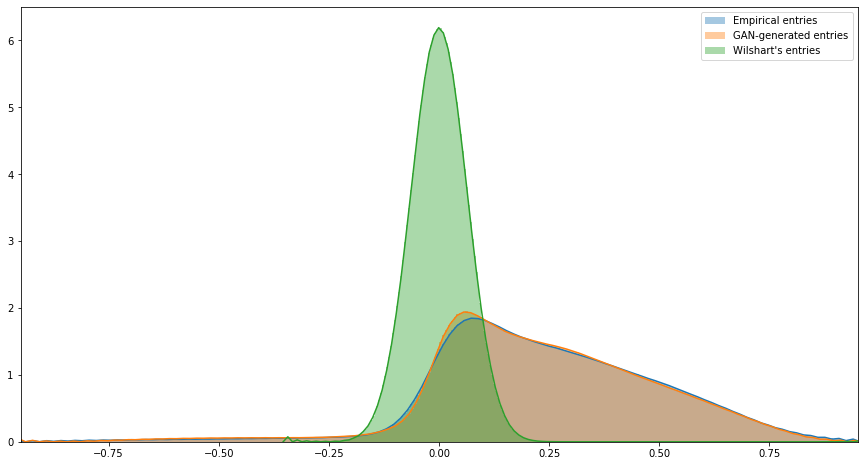

In [0]:
plt.figure(figsize=(15,8))
sns.distplot(X, bins = 300, label = 'Empirical entries', kde=True, norm_hist=True)
sns.distplot(proj_fake, bins = 300, label = 'GAN-generated entries', kde=True, norm_hist=True)
sns.distplot(rnd_psd, bins = 300, label = 'Wilshart\'s entries', kde=True, norm_hist=True)

plt.xlim(-0.95, 0.95)
plt.legend()
plt.show()

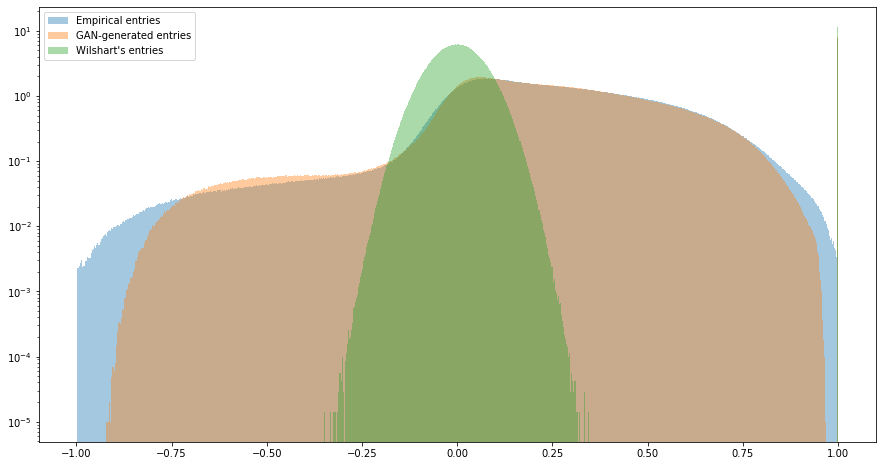

In [0]:
plt.figure(figsize=(15,8))
ax = sns.distplot(X, bins = 1000, label = 'Empirical entries', kde=False, norm_hist=True)
sns.distplot(proj_fake, bins = 1000, label = 'GAN-generated entries', kde=False, norm_hist=True)
sns.distplot(rnd_psd, bins = 1000, label = 'Wilshart\'s entries', kde=False, norm_hist=True)

ax.set_yscale('log')
# plt.xlim(-0.95, 0.95)
plt.legend()
plt.show()